In [10]:
import os


import matplotlib.pyplot as plt
from PIL import Image

%matplotlib inline

In [11]:
def plot_image(path_to_image, title=None):
    image = Image.open(os.path.abspath(path_to_image))
    
    plt.tick_params(
    axis='both',
    which='both',     
    bottom=False,         
    left=False,
    labelbottom=False,
    labelleft=False)
    
    if title is not None:
        plt.title(title)
    plt.imshow(image)

In [67]:
def plot_collage(path_to_collage, n_rows=4, n_cols=11):
    collage_style = Image.open(os.path.abspath(path_to_collage))
    plt.figure(figsize=(2 * n_cols, 2 * n_rows))
    
    plt.tick_params(
    axis='both',
    which='both',     
    bottom=False,         
    left=False,
    labelbottom=False,
    labelleft=False)
    
    plt.imshow(collage_style)

# A Neural Algorithm of Artistic Style
Leon A. Gatys, Alexander S. Ecker, Matthias Bethge
(https://arxiv.org/pdf/1508.06576.pdf)

#### main working jupyter-notebook - NST_Gatys_working_notebook.ipynb
#### all experiments you can find here:
github: https://github.com/kirill-ionkin/NST_Gatys

## Tasks

### 1) Implement an algorithm(Neural Algorithm of Artistic Style)
### 2) Analysis(visual threshold, style and content weights, etc.)
### 3) Create working juputer notebook(Colab_working_notebook.ipynb)

##  Implement an algorithm(Neural Algorithm of Artistic Style)

### 1) Architecture of nst model 

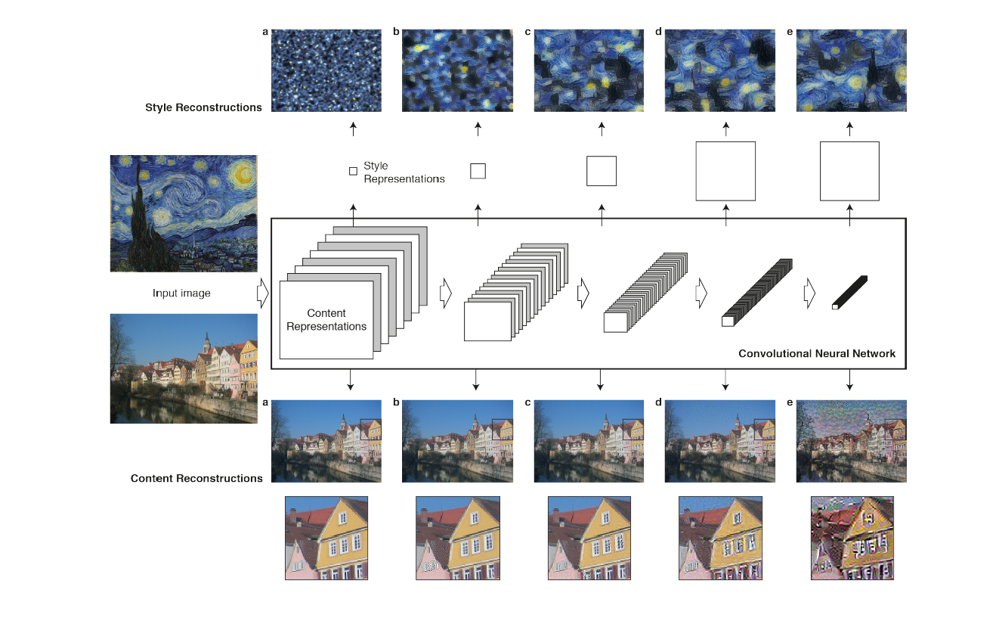

In [6]:
architecture = Image.open("ignore_folder/architecture.png")
architecture

In [7]:
vgg_19_layers_names = {
                    <- Normalization
    0: "conv1_1",
                    <- StyleLoss
    1: "relu1_1",
    2: "conv1_2",
    3: "relu1_2",
    4: "pool1",
    
    5: "conv2_1",
                    <- StyleLoss
    6: "relu2_1",
    7: "conv2_2",
    8: "relu2_2",
    9: "pool2",
    
    10: "conv3_1",
                    <- StyleLoss
    11: "relu3_1",
    12: "conv3_2",
    13: "relu3_2",
    14: "conv3_3",
    15: "relu3_3",
    16: "conv3_4",
    17: "relu3_4",
    18: "pool3",
    
    19: "conv4_1",
                    <- StyleLoss
    20: "relu4_1",
    21: "conv4_2",
    22: "relu4_2",
                    <- ContentLoss
    23: "conv4_3",
    24: "relu4_3",
    25: "conv4_4",
    26: "relu4_4",
    27: "pool4",
    
    28: "conv5_1",
                    <- StyleLoss
    29: "relu5_1",
    30: "conv5_2",
    31: "relu5_2",
    32: "conv5_3",
    33: "relu5_3",
    34: "conv5_4",
    35: "relu5_4",
    36: "pool5"
}

Пример расположения слоёв(Content Loss, StyleLoss) для подсчёта content loss, style loss соответственно.
Почему же именно такое расположение слоёв, а не какое-то другое?

In [ ]:
content_layers_default = ["conv4_2"]
style_layers_default = ["conv1_1", "conv2_1", "conv3_1", "conv4_1", "conv5_1"]

### 2) ContentLoss, StyleLoss, Normalization
https://github.com/kirill-ionkin/NST_Gatys/blob/main/layers.py

In [ ]:
class ContentLoss(nn.Module):
    
    def __init__(self, content_target):
        super(ContentLoss, self).__init__()
        self.target = content_target.detach()
        self.mode = "create_model"
        self.loss  = None
        
    def forward(self, x):
        if self.mode == "loss":
            self.loss = F.mse_loss(x, self.target)
        return x

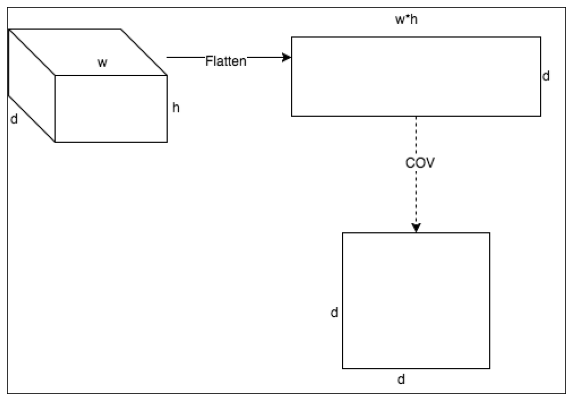

In [71]:
plt.figure(figsize=(10, 10))
plot_image("ignore_folder/style_loss_target.png")

In [ ]:
class StyleLoss(nn.Module):
    
    def __init__(self, style_target):
        super(StyleLoss, self).__init__()
        self.target = gram_matrix(style_target.detach())
        self.mode = "create_model"
        self.loss = None
        
    def forward(self, x):
        if self.mode == "loss":
            batch_size, c, h, w = x.size()
            self.loss = F.mse_loss(gram_matrix(x), self.target)
        return x

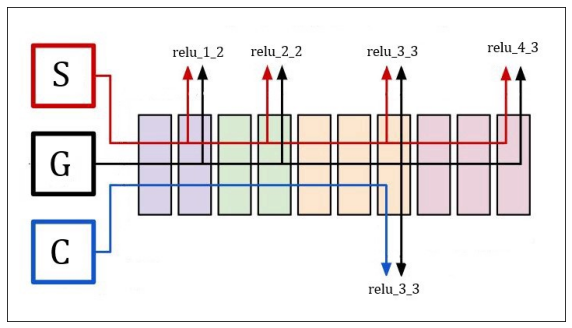

In [72]:
plt.figure(figsize=(10, 10))
plot_image("ignore_folder/architecture_2.png")

 ## 2) Analysis results

### visual threshold, style and content weights, warm start(or input_image - gaussian noise)

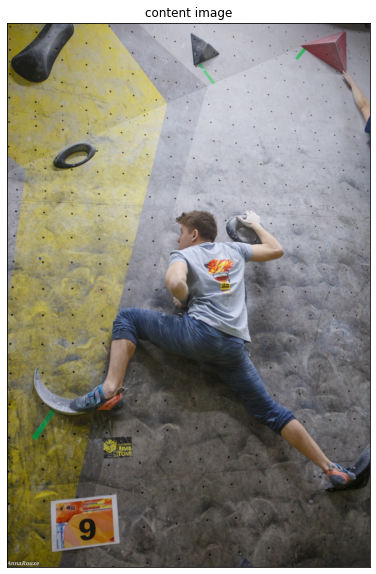

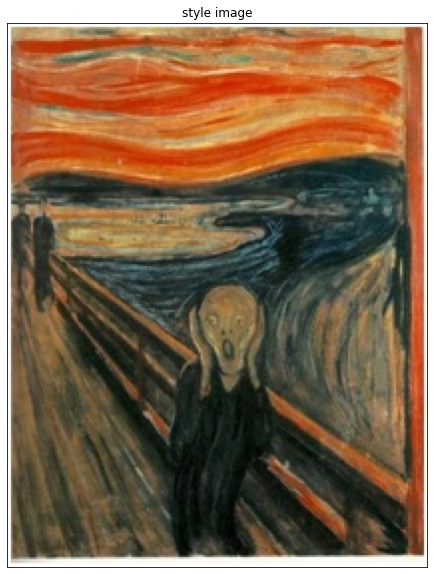

In [51]:
plt.figure(figsize=(15, 10))
plot_image("example/content.jpg", title="content image")

plt.figure(figsize=(15, 10))
plot_image("example/style.jpg", title="style image")

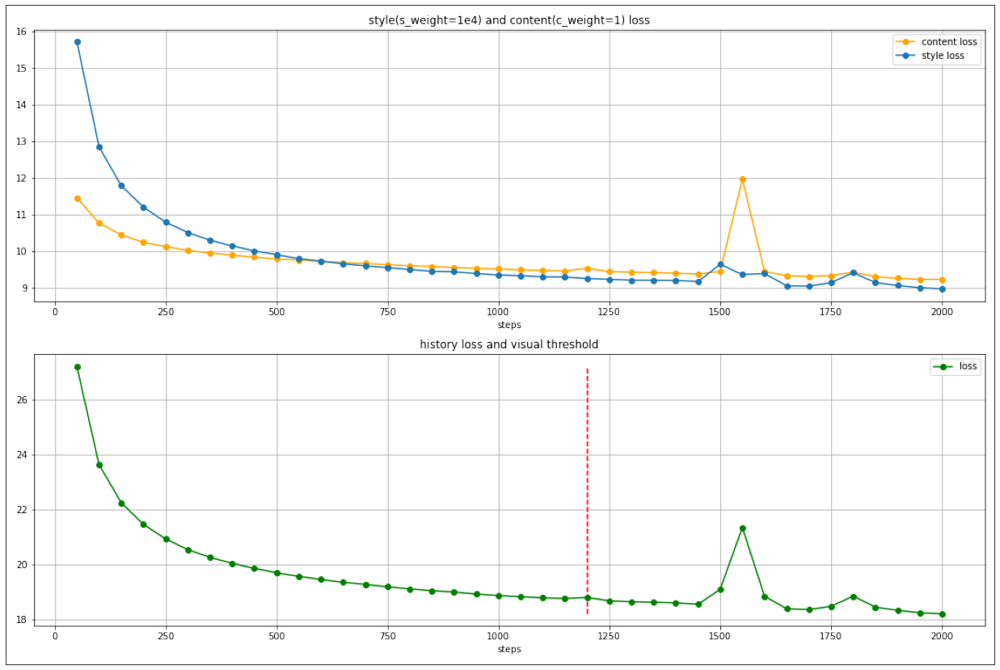

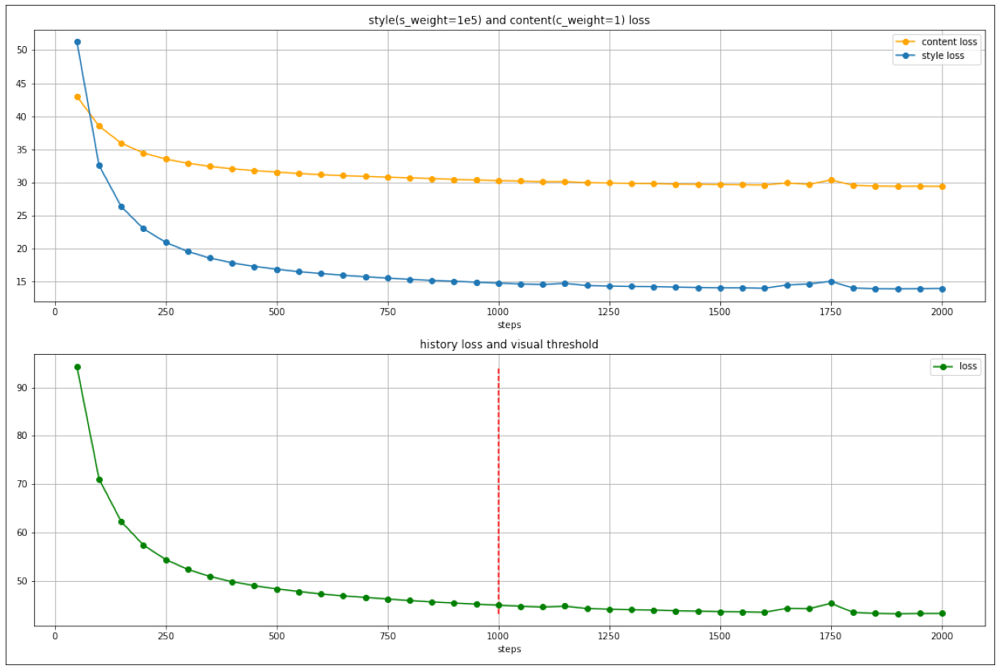

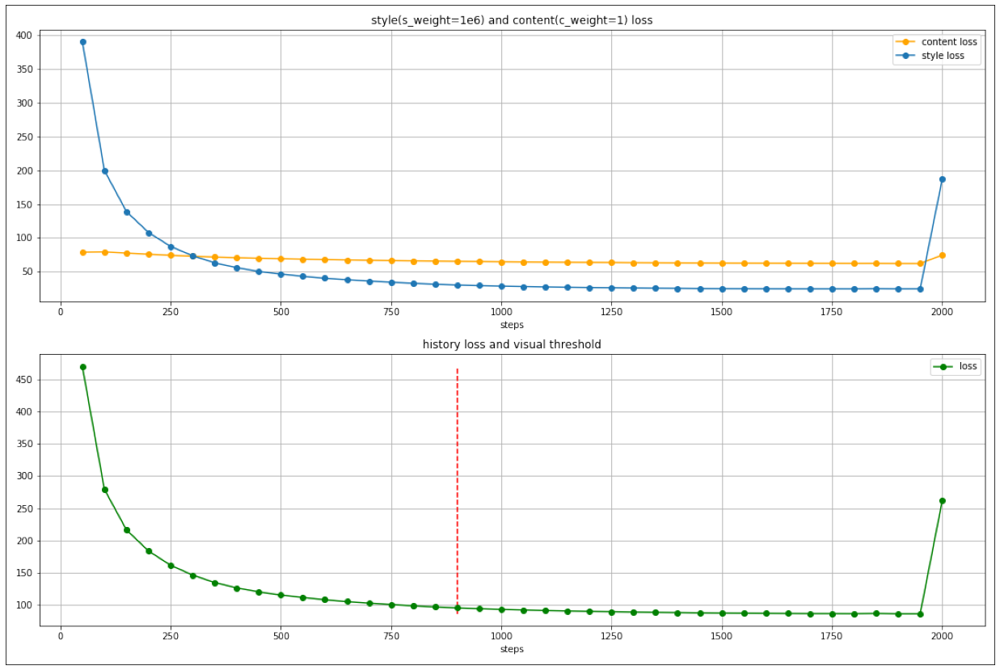

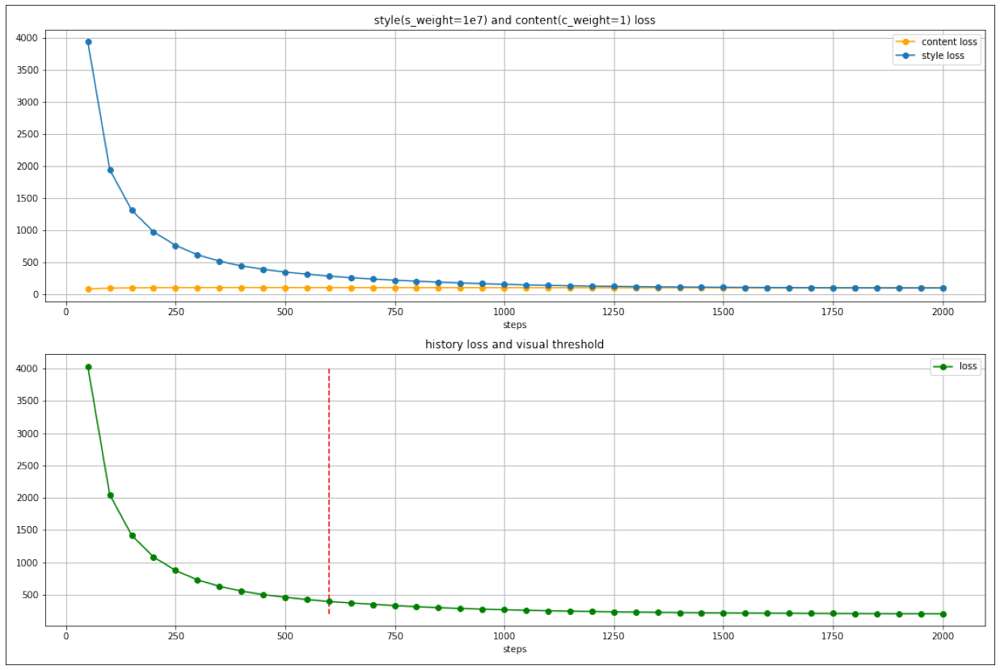

In [40]:
plt.figure(figsize=(25, 15))
plot_image(path_to_image="results/style/c_1_s_1e4.png")

plt.figure(figsize=(25, 15))
plot_image(path_to_image="results/style/c_1_s_1e5.png")

plt.figure(figsize=(25, 15))
plot_image(path_to_image="results/style/c_1_s_1e6.png")

plt.figure(figsize=(25, 15))
plot_image(path_to_image="results/style/c_1_s_1e7.png")

#### input image - content_image

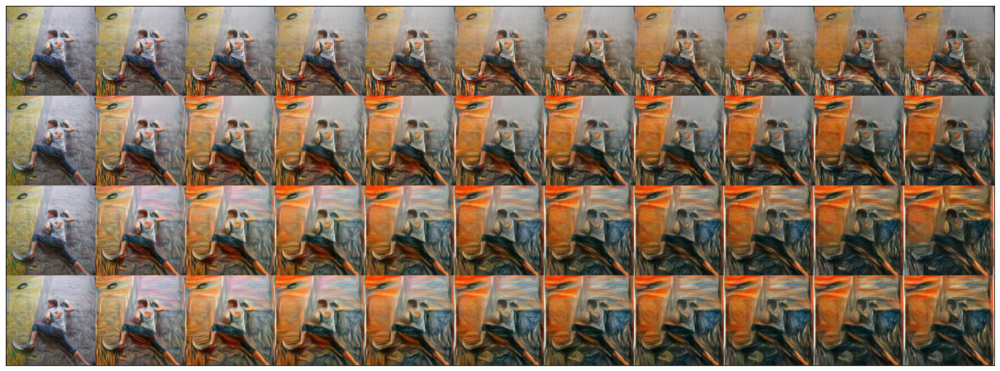

In [49]:
plot_collage(path_to_collage="results/style/collage_style.png")

#### input image - input_image - gaussian noise

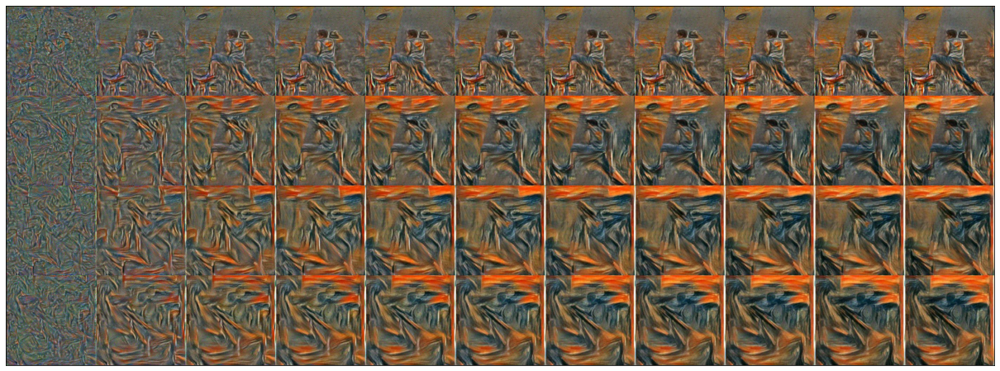

In [52]:
plot_collage(path_to_collage="results/style/collage_noise.png")

### other styles(style_weights={1e6, 1e7},num_steps=1000)

#### style_1

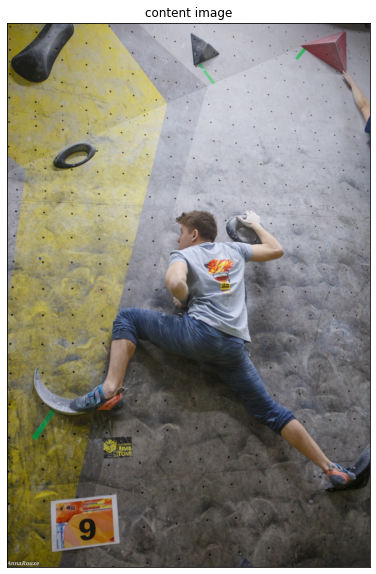

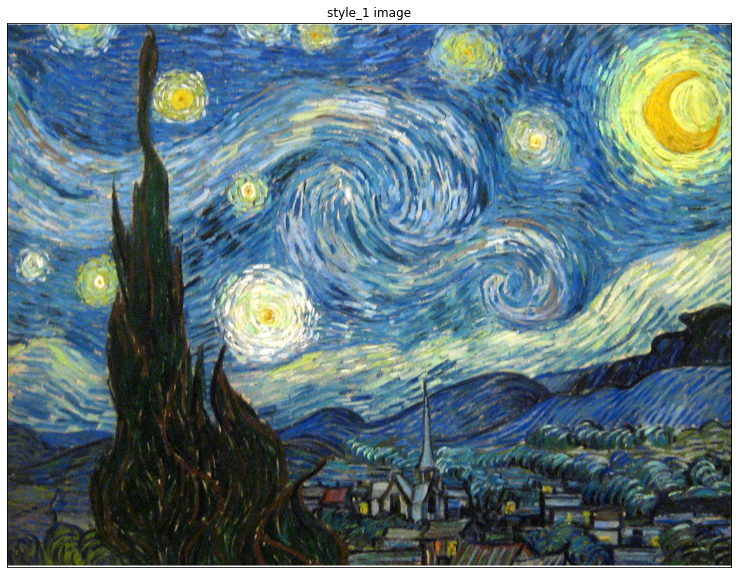

In [53]:
plt.figure(figsize=(15, 10))
plot_image("example/content.jpg", title="content image")

plt.figure(figsize=(15, 10))
plot_image("example/style_1.jpg", title="style_1 image")

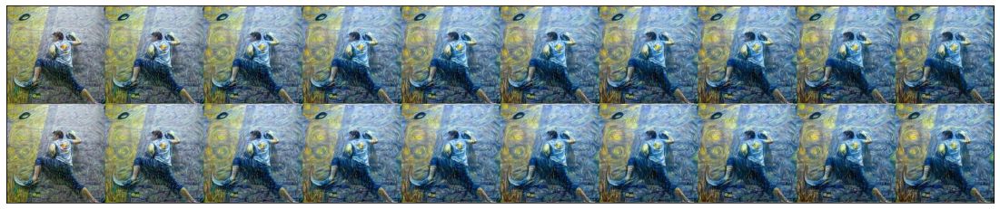

In [56]:
plot_collage(path_to_collage="results/style_1/collage_style_1.png", n_rows=2, n_cols=10)

#### style_2

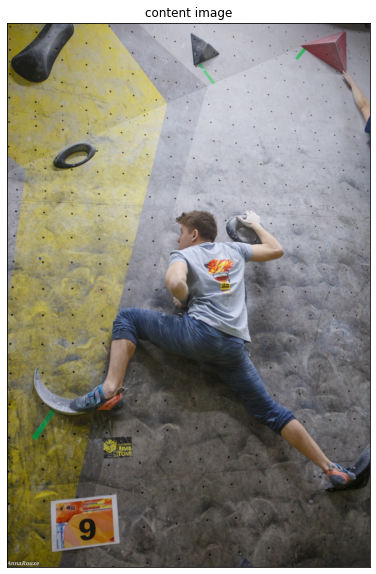

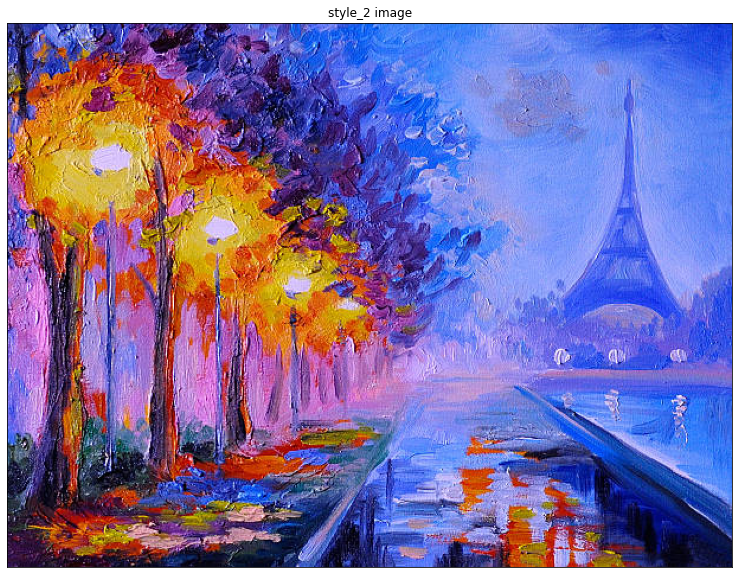

In [57]:
plt.figure(figsize=(15, 10))
plot_image("example/content.jpg", title="content image")

plt.figure(figsize=(15, 10))
plot_image("example/style_2.jpg", title="style_2 image")

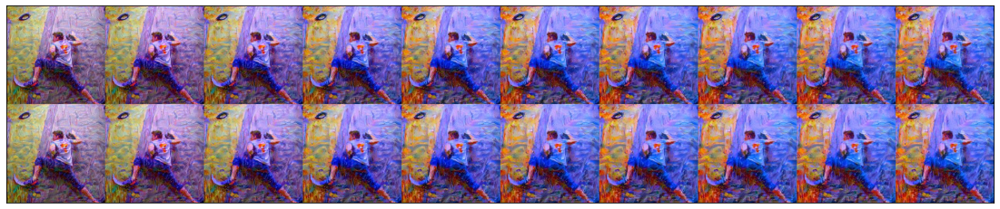

In [58]:
plot_collage(path_to_collage="results/style_2/collage_style_2.png", n_rows=2, n_cols=10)

#### style_3

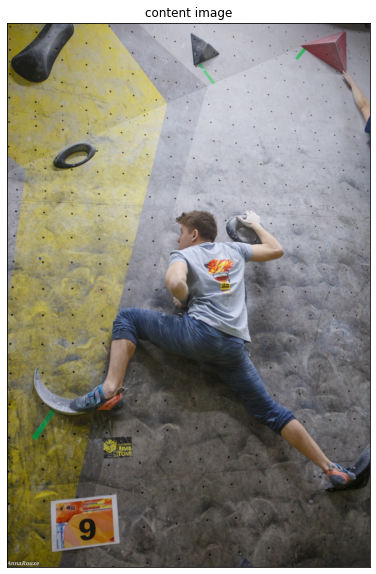

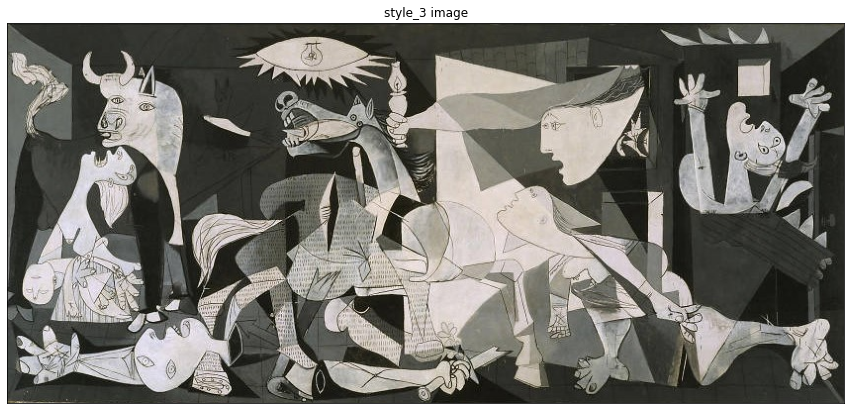

In [60]:
plt.figure(figsize=(15, 10))
plot_image("example/content.jpg", title="content image")

plt.figure(figsize=(15, 10))
plot_image("example/style_3_sliced.jpg", title="style_3 image")

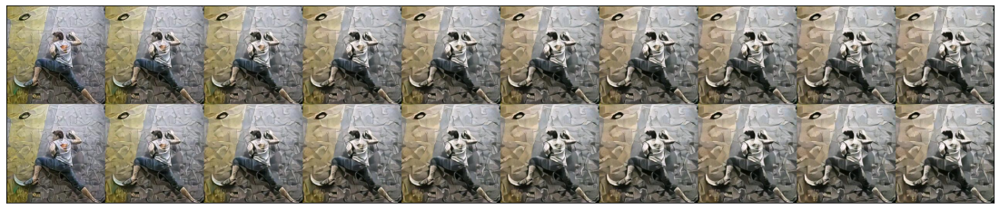

In [61]:
plot_collage(path_to_collage="results/style_3/collage_style_3.png", n_rows=2, n_cols=10)

#### style_4

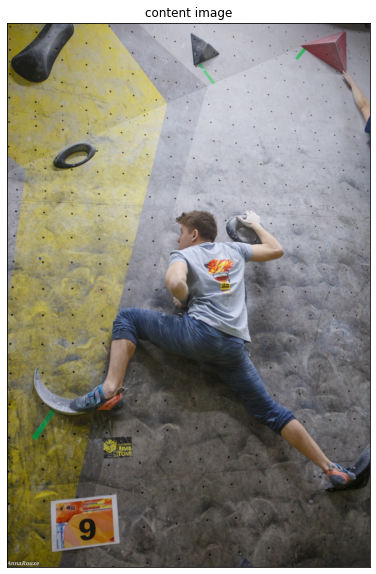

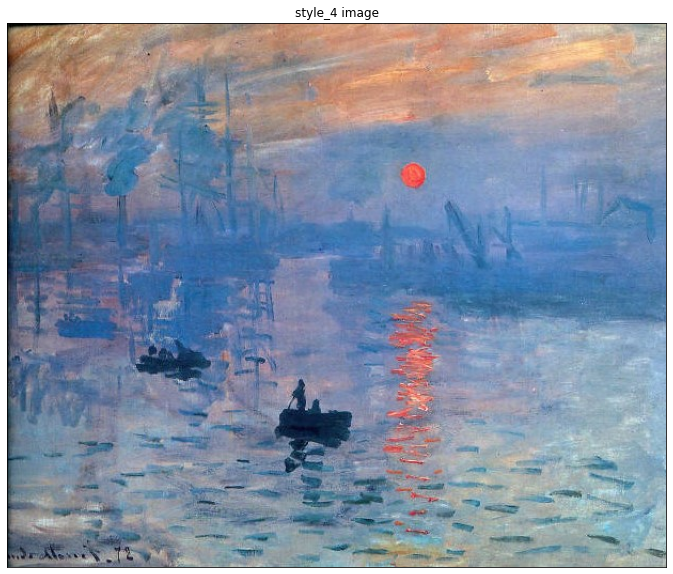

In [62]:
plt.figure(figsize=(15, 10))
plot_image("example/content.jpg", title="content image")

plt.figure(figsize=(15, 10))
plot_image("example/style_4_sliced.jpg", title="style_4 image")

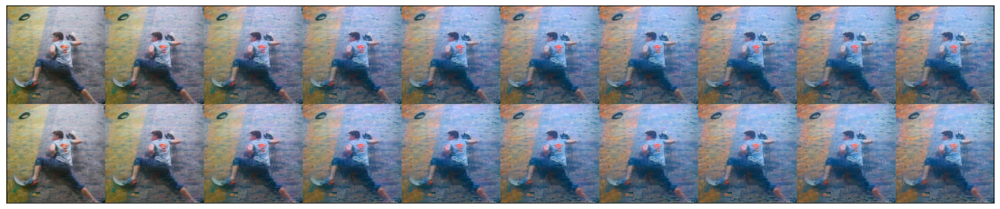

In [64]:
plot_collage(path_to_collage="results/style_4/collage_style_4.png", n_rows=2, n_cols=10)

#### style_5

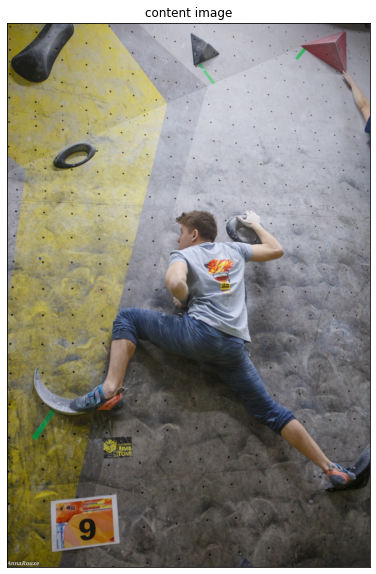

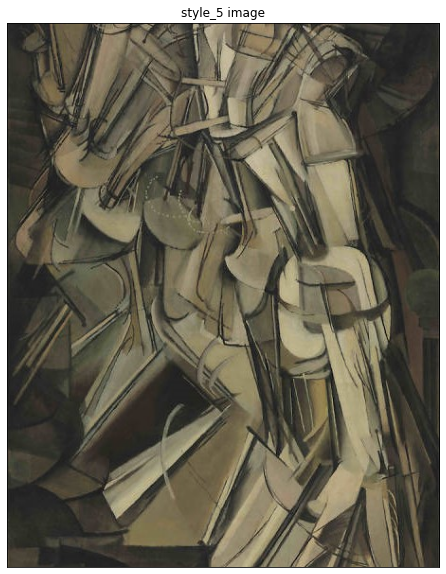

In [65]:
plt.figure(figsize=(15, 10))
plot_image("example/content.jpg", title="content image")

plt.figure(figsize=(15, 10))
plot_image("example/style_5_sliced.jpg", title="style_5 image")

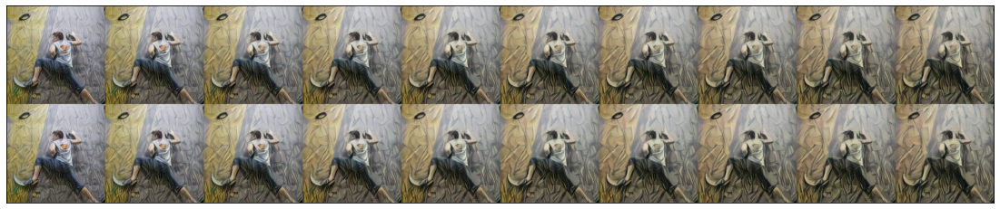

In [66]:
plot_collage(path_to_collage="results/style_5/collage_style_5.png", n_rows=2, n_cols=10)

## 3) Create working juputer notebook(Colab_working_notebook.ipynb)

https://github.com/kirill-ionkin/NST_Gatys/blob/main/Colab_working_notebook.ipynb